In [113]:
import pandas as pd; pd.set_option('display.max_columns', 1000);
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.express as px
from ydata_profiling import ProfileReport
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_predict, KFold
import xgboost as xgb
import pickle
import joblib
from sklearn.metrics import mean_absolute_error, mean_squared_error
import optuna
bold = "\033[1m"
reset = "\033[0m"

Outlining the Process of Exploration:
- [Exploring Missing Values](#nulls)
- [Exploring Duplicates](#dupes)
- [Exploring Outliers](#outliers)

In [79]:
accenture_colors = ['#A100FF', '#000000']

In [80]:
data = pd.read_excel('datos_ie.xlsx')
data.head()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,...,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
0,1,51,16.04,28348,2020,2,0,0,0,0,...,8,2,0,0,0,0,0,0,16,4
1,1,51,16.04,28348,2020,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,51,16.04,28348,2020,3,0,2,2,0,...,1,1,0,0,0,0,0,0,16,4
3,1,51,16.04,28348,2020,4,0,6,6,0,...,2,1,0,0,0,0,0,0,16,4
4,1,51,16.04,28348,2019,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
# Overview of the Data
print(f"Shape of the DataFrame: {data.shape}\n")

# Printing each column name and its data type
print("Columns and their data type:")
for column, dtype in data.dtypes.items():
    print(f"{bold+column+reset}: {dtype}")

Shape of the DataFrame: (85436, 117)

Columns and their data type:
npi: int64
countyID: int64
census_tract: float64
zip5: int64
service_year: int64
service_quarter: int64
standard_services_claims: int64
tele_services_claims: int64
total_claims: int64
standard_services_patients: int64
tele_services_patients: int64
total_patients: int64
standard_services_claims_year: int64
tele_services_claims_year: int64
total_claims_year: int64
standard_services_patients_year: int64
tele_services_patients_year: int64
total_patients_year: int64
standard_services_psychotherapy_claims: int64
tele_services_psychotherapy_claims: int64
total_psychotherapy_claims: int64
standard_services_psychotherapy_patients: int64
tele_services_psychotherapy_patients: int64
total_psychotherapy_patients: int64
standard_services_psychotherapy_claims_year: int64
tele_services_psychotherapy_claims_year: int64
total_psychotherapy_claims_year: int64
standard_services_psychotherapy_patients_year: int64
tele_services_psychotherapy

### Exploring Nulls <a id='nulls'></a>

In [82]:
# Filtering the columns which have null values and printing them
nulls = data.isnull().sum()
null_columns = nulls[nulls > 0]
for col, null_count in null_columns.items():
    print(f'Column "{bold+col+reset}" has {null_count} null values.')

Column "NPI_Deactivation_Reason_Code" has 85436 null values.
Column "NPI_Deactivation_Date" has 85316 null values.
Column "NPI_Reactivation_Date" has 85316 null values.
Column "Specialization_1" has 32684 null values.


In [83]:
# Percentage of missing values in each column
print("\nPercentage of missing values in each column:")
null_percentage = data.isnull().mean() * 100
null_percentage = null_percentage[null_percentage > 0]
for col, percentage in null_percentage.items():
    print(f'Column "{bold+col+reset}" has {percentage:.2f}% missing values.')


Percentage of missing values in each column:
Column "NPI_Deactivation_Reason_Code" has 100.00% missing values.
Column "NPI_Deactivation_Date" has 99.86% missing values.
Column "NPI_Reactivation_Date" has 99.86% missing values.
Column "Specialization_1" has 38.26% missing values.


The first three columns can be removed because at least 99.5% of their data are null values.

In [84]:
data = data.drop(columns=["NPI_Deactivation_Reason_Code", "NPI_Deactivation_Date", "NPI_Reactivation_Date"])

### Exploring Duplicated Rows <a id='dupes'></a>

In [85]:
# Checking for duplicates
print(f"Number of duplicate rows: {data.duplicated().sum()}")

Number of duplicate rows: 0


### Exploring Outlier Values <a id='outliers'></a>

In [86]:
# Exploring outliers in the data for each type of claim using plotly 
fig = go.Figure()
fig.add_trace(go.Box(y=data["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data["standard_services_claims"], name="Total Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data["tele_services_claims"], name="Total Tele Services Claims", marker_color="red"))
fig.update_layout(title="Outliers in the Data", yaxis_title="Amount in USD")
fig.show()

In [87]:
# Filtering 3 dataframes per service_year and plotting outliers 
data_2018 = data[data["service_year"] == 2018]
data_2019 = data[data["service_year"] == 2019]
data_2020 = data[data["service_year"] == 2020]

In [88]:
# Exploring outliers for the 3 years and 3 types of claims by plotting using plotly
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["total_claims"], name="2018 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2019["total_claims"], name="2019 Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_2020["total_claims"], name="2020 Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims for 2018, 2019, and 2020", yaxis_title="Total Claims")

In [89]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["standard_services_claims"], name="2018 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2019["standard_services_claims"], name="2019 Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_2020["standard_services_claims"], name="2020 Standard Services Claims", marker_color=accenture_colors[0]))
fig.update_layout(title="Standard Services Claims for 2018, 2019, and 2020", yaxis_title="Standard Services Claims")

In [90]:
fig = go.Figure()
fig.add_trace(go.Box(y=data_2018["tele_services_claims"], name="2018 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2019["tele_services_claims"], name="2019 Tele Services Claims", marker_color="red"))
fig.add_trace(go.Box(y=data_2020["tele_services_claims"], name="2020 Tele Services Claims", marker_color="red"))
fig.update_layout(title="Tele Services Claims for 2018, 2019, and 2020", yaxis_title="Tele Services Claims")

In [91]:
# analyze outliers where the median is not 0 
data_outliers = data[(data["total_claims"] > 0) | (data["standard_services_claims"] > 0) | (data["tele_services_claims"] > 0)]

# plot the outliers where median is not 0 using plotly
fig = go.Figure()
fig.add_trace(go.Box(y=data_outliers["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_outliers["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_outliers["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Outliers for Total, Standard Services, and Tele Services Claims", yaxis_title="Claims")


In [92]:
# Analyzing claims and standard services above 10,000 using plotly 
data_above_10000 = data[(data["total_claims"] > 10000) | (data["standard_services_claims"] > 10000) | (data["tele_services_claims"] > 10000)]
fig = go.Figure()
fig.add_trace(go.Box(y=data_above_10000["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Box(y=data_above_10000["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Box(y=data_above_10000["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Claims above 10,000", yaxis_title="Claims")

In [93]:
# Understanding the distribution of the data over the quarters and years

# Grouping the data by service_year and service_quarter to see the total claims per quarter/year
data_quarterly = data.groupby(["service_year", "service_quarter"]).sum().reset_index()
data_quarterly["service_year"] = data_quarterly["service_year"].astype(str)
data_quarterly["service_quarter"] = data_quarterly["service_quarter"].astype(str)
data_quarterly["service_year_quarter"] = data_quarterly["service_year"] + " Q" + data_quarterly["service_quarter"]
data_quarterly = data_quarterly.sort_values(by=["service_year", "service_quarter"])

# Plotting the total claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.update_layout(title="Total Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Total Claims")

In [94]:
# Grouped bar chart for total claims, standard services claims, and tele services claims per quarter/year
fig = go.Figure()
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["total_claims"], name="Total Claims", marker_color=accenture_colors[1]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["standard_services_claims"], name="Standard Services Claims", marker_color=accenture_colors[0]))
fig.add_trace(go.Bar(x=data_quarterly["service_year_quarter"], y=data_quarterly["tele_services_claims"], name="Tele Services Claims", marker_color="red"))
fig.update_layout(title="Total, Standard Services, and Tele Services Claims per Quarter/Year", xaxis_title="Quarter/Year", yaxis_title="Claims")

In [95]:
# report = ProfileReport(data)
# report.to_file(output_file="data_report.html")

In [96]:
# Calculate the sum of 'total_psychological_claims' and 'total_claims'
total_psychotherapy_claims_sum = data['total_psychotherapy_claims'].sum()
total_claims_sum = data['total_claims'].sum()

# Print results
print(f"Sum of total_psychotherapy_claims: {total_psychotherapy_claims_sum}")
print(f"Sum of total_claims: {total_claims_sum}")

Sum of total_psychotherapy_claims: 2820802
Sum of total_claims: 4510198


In [105]:
# checking standard and tele services claims add up to total claims
total_standard_services_claims_sum = data['standard_services_claims'].sum()
total_tele_services_claims_sum = data['tele_services_claims'].sum()

# Print results
print(f"Sum of standard_services_claims: {total_standard_services_claims_sum}")
print(f"Sum of tele_services_claims: {total_tele_services_claims_sum}")
print(f"Sum of standard_services_claims + tele_services_claims: {total_standard_services_claims_sum + total_tele_services_claims_sum}")
print(f"Total Claims: {total_claims_sum}")
print(f"Total Claims = (Standard Services Claims + Tele Services Claims): {total_claims_sum == (total_standard_services_claims_sum + total_tele_services_claims_sum)}")

Sum of standard_services_claims: 3089836
Sum of tele_services_claims: 1420362
Sum of standard_services_claims + tele_services_claims: 4510198
Total Claims: 4510198
Total Claims = (Standard Services Claims + Tele Services Claims): True


In [98]:
# getting column names with claims in the name using regex 
claims_columns = data.filter(regex='claims').columns
print(f"Columns with 'claims' in their name: {claims_columns}")

Columns with 'claims' in their name: Index(['standard_services_claims', 'tele_services_claims', 'total_claims',
       'standard_services_claims_year', 'tele_services_claims_year',
       'total_claims_year', 'standard_services_psychotherapy_claims',
       'tele_services_psychotherapy_claims', 'total_psychotherapy_claims',
       'standard_services_psychotherapy_claims_year',
       'tele_services_psychotherapy_claims_year',
       'total_psychotherapy_claims_year', '%psychotherapy_claims',
       '%teleService_claims', '%tele_psychotherapy_claims',
       '%psychotherapy_claims_year', '%teleService_claims_year',
       '%tele_psychotherapy_claims_year', 'total_medicaid_claims',
       'total_commercial_claims', 'total_medicare_claims',
       'total_other_payers_claims', 'total_commercial_claims_year',
       'total_medicaid_claims_year', 'total_medicare_claims_year',
       'total_other_payers_claims_year'],
      dtype='object')


In [99]:
# Filter through combinations of columns to find the ones that add up to 'total_claims'
# Double checking that total_claims is the sum of the teleservices and standard services claims
for col1 in claims_columns:
    for col2 in claims_columns:
        if col1 != col2:
            if data[col1].sum() + data[col2].sum() == total_claims_sum:
                print(f"Columns {col1} and {col2} add up to total_claims")

Columns standard_services_claims and tele_services_claims add up to total_claims
Columns tele_services_claims and standard_services_claims add up to total_claims


In [100]:
# Displaying the distribution of total vs. psychotherapy claims by specialization 
data1 = data[data['Specialization_1'].notna()]
grouped_total_claims = data1.groupby('Specialization_1')['total_claims'].sum()
grouped_total_psychotherapy_claims = data1.groupby('Specialization_1')['total_psychotherapy_claims'].sum()

In [101]:
df_total_claims = grouped_total_claims.reset_index(name='Sum of Total Claims')
df_total_psychotherapy_claims = grouped_total_psychotherapy_claims.reset_index(name='Sum of Total Psychotherapy Claims')
df_merged = pd.merge(df_total_claims, df_total_psychotherapy_claims, on='Specialization_1')
df_merged

,Specialization_1,Sum of Total Claims,Sum of Total Psychotherapy Claims
0,Addiction (Substance Use Disorder),119066,109509
1,Addiction Medicine,8740,1335
2,Addiction Psychiatry,1408,121
3,Adolescent Medicine,6147,1039
4,Adolescent and Children Mental Health,38464,27246
...,...,...,...
123,"Substance Abuse Treatment, Children",904,788
124,Surgical,286,85
125,Urgent Care,1502,240
126,VA,24522,6573


In [102]:
# Exploring the sums of total claims by classification instead of specialization - might be removed later
data1 = data[data['Classification_1'].notna()]
grouped_total_claims = data1.groupby('Classification_1')['total_claims'].sum()
grouped_total_psychotherapy_claims = data1.groupby('Classification_1')['total_psychotherapy_claims'].sum()

In [103]:
df_total_claims = grouped_total_claims.reset_index(name='Sum of Total Claims')
df_total_psychotherapy_claims = grouped_total_psychotherapy_claims.reset_index(name='Sum of Total Psychotherapy Claims')
df_merged = pd.merge(df_total_claims, df_total_psychotherapy_claims, on='Classification_1')
df_merged

,Classification_1,Sum of Total Claims,Sum of Total Psychotherapy Claims
0,Advanced Practice Midwife,527,45
1,Allergy & Immunology,1281,231
2,Alzheimer Center (Dementia Center),109,33
3,Ambulance,15854,395
4,Anesthesiology,753,41
...,...,...,...
92,Speech-Language Pathologist,16301,6415
93,Student in an Organized Health Care Education/...,20169,3473
94,Substance Abuse Rehabilitation Facility,1899,1027
95,Surgery,3099,303


In [36]:
# Sum across individual sums of claims
sum_total_claims = df_merged['Sum of Total Claims'].sum()
sum_total_psychotherapy_claims = df_merged['Sum of Total Psychotherapy Claims'].sum()

print(f"Sum of 'Sum of Total Claims' column: {sum_total_claims}")
print(f"Sum of 'Sum of Total Psychotherapy Claims' column: {sum_total_psychotherapy_claims}")

Sum of 'Sum of Total Claims' column: 4510198
Sum of 'Sum of Total Psychotherapy Claims' column: 2820802


### Exploring the Columns

In [114]:
data.describe()

,npi,countyID,census_tract,zip5,service_year,service_quarter,standard_services_claims,tele_services_claims,total_claims,standard_services_patients,tele_services_patients,total_patients,standard_services_claims_year,tele_services_claims_year,total_claims_year,standard_services_patients_year,tele_services_patients_year,total_patients_year,standard_services_psychotherapy_claims,tele_services_psychotherapy_claims,total_psychotherapy_claims,standard_services_psychotherapy_patients,tele_services_psychotherapy_patients,total_psychotherapy_patients,standard_services_psychotherapy_claims_year,tele_services_psychotherapy_claims_year,total_psychotherapy_claims_year,standard_services_psychotherapy_patients_year,tele_services_psychotherapy_patients_year,total_psychotherapy_patients_year,%psychotherapy_claims,%teleService_claims,%tele_psychotherapy_claims,%psychotherapy_patients,%stdService_patients,%teleService_patients,%tele_psychotherapy_patients,%psychotherapy_claims_year,%teleService_claims_year,%tele_psychotherapy_claims_year,%psychotherapy_patients_year,%stdService_patients_year,%teleService_patients_year,%tele_psychotherapy_patients_year,psychotherapy_provider_through_taxonomy,provided_psychotherapy,psychotherapy_provider,lat,long,transport_access,broadband_access,total_medicaid_claims,total_medicaid_patients,Entity_Type_Code,AH_Sign language services for the deaf and hard of hearing,EN_English,SP_Spanish,NX_American Indian or Alaska Native languages,FX_Other languages (excluding Spanish),F4_Arabic,F17_Any Chinese Language,F19_Creole,F25_Farsi,F28_French,F30_German,F31_Greek,F35_Hebrew,F36_Hindi,F37_Hmong,F42_Italian,F43_Japanese,F47_Korean,F66_Polish,F67_Portuguese,F70_Russian,F81_Tagalog,F92_Vietnamese,N24_Ojibwa,N40_Yupik,Spoken_Language_Accessibility,black_owned,latino_owned,lgbtq+_owned,veteran_owned,women_owned,planning_accepts_new_patients,total_commercial_claims,total_commercial_patients,total_medicare_claims,total_medicare_patients,total_other_payers_claims,total_other_payers_patients,total_commercial_claims_year,total_commercial_patients_year,total_medicaid_claims_year,total_medicaid_patients_year,total_medicare_claims_year,total_medicare_patients_year,total_other_payers_claims_year,total_other_payers_patients_year
count,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.0,85436.0,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000,85436.000000
mean,5697.912824,99.264994,1596.168509,28056.997097,2019.162648,2.500000,36.165504,16.624865,52.790369,10.643417,4.618404,15.261822,144.662016,66.499462,211.161478,23.920783,9.911794,33.832576,19.581792,13.434758,33.016550,4.668114,3.272227,7.940341,78.327169,53.739033,132.066202,10.092748,7.058102,17.150850,0.515274,0.167675,0.180434,0.526053,0.623559,0.170849,0.182856,0.700646,0.214836,0.257115,0.723820,0.786766,0.213234,0.248388,0.613371,

<Axes: >

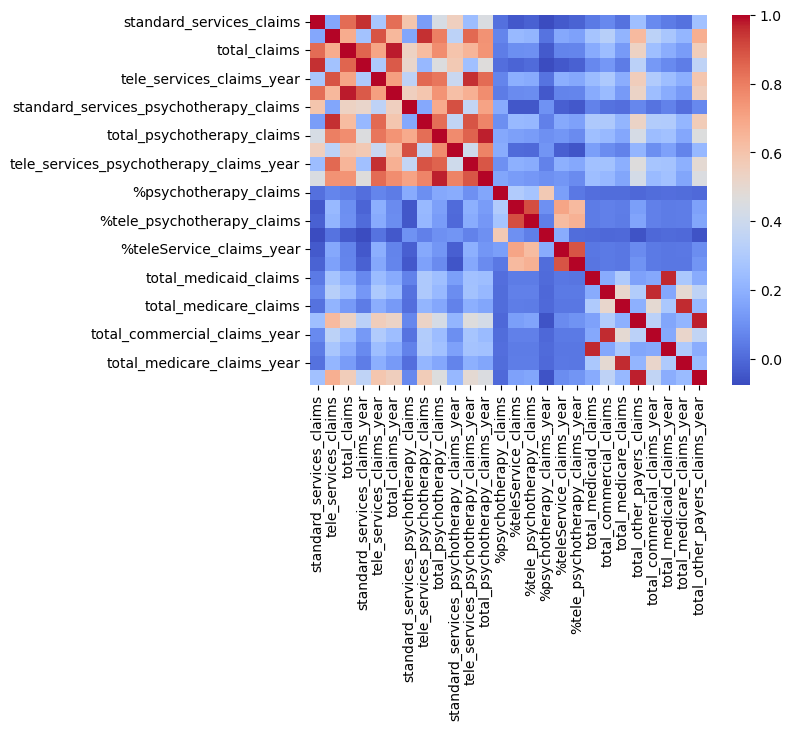

In [120]:
# exploring preliminary correlation matrix of columns
# columns with claims in the name 
corr_claims = data[claims_columns].corr()
sns.heatmap(corr_claims, cmap='coolwarm', fmt=".2f")